In [5]:
import sys
import os
import json
import torch
from torch.utils.data import DataLoader
import torchvision
import torchvision.models as models
import numpy as np
import cv2
import matplotlib.pyplot as plt

from pathlib import Path
# Add the parent directory to the Python path
sys.path.append(str(Path().resolve().parent))
import utils
import trainer
import evaluator
import data_process
import motion_blur

# Set random seed for reproducibility
seed = 211
np.random.seed(seed)
torch.manual_seed(seed)

In [6]:
input_size = 300

transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize((input_size, input_size)),
    torchvision.transforms.ToTensor(), # uint8 values in [0, 255] -> float tensor with values [0, 1]
    torchvision.transforms.Normalize(mean=data_process.train_mean.tolist(), std=data_process.train_std.tolist())
])

train_set, val_set, test_set = data_process.load_data(transform=transform, input_size=input_size, img_dir=os.path.join('..', data_process.img_dir), ann_dir=os.path.join('..', data_process.ann_dir))   

test_set_uni_001 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'uniform', 'a': 0.01})
test_set_uni_005 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'uniform', 'a': 0.05})
test_set_uni_01 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'uniform', 'a': 0.1})
test_set_elli_001 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'ellipse', 'a': 0.01})
test_set_elli_005 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'ellipse', 'a': 0.05})
test_set_elli_01 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'ellipse', 'a': 0.1})
test_set_nat = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'natural', 'kernel_path': '../data/motion_blur_data'})

Data already exists

Number of valid images: 664
Train set size: 464 - 69.88%
Validation set size: 67 - 10.09%
Test set size: 133 - 20.03%



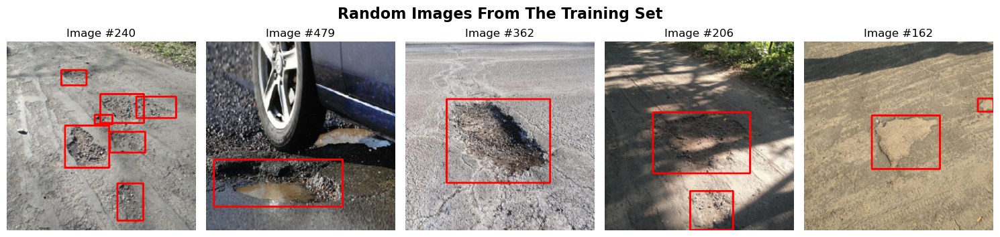

In [7]:
# Display 5 random images from the training set
train_loader = DataLoader(train_set, batch_size=5, shuffle=True, collate_fn=data_process.collate_fn)
images, targets = next(iter(train_loader))
data_process.show_images(images, targets, title="Random Images From The Training Set")

In [8]:
history = trainer.train_from_config(model_config_path="../data/models/ssd300_vgg16/ssd300_vgg16_best_params.json", train_set=train_set, val_set=val_set, save_path="../data/models/ssd300_vgg16", kornia_aug=False)

Starting training for ssd300_vgg16 with the following parameters:
{'batch_size': 8, 'epochs': 100, 'preweight_mode': 'fine_tuning', 'optimizer': 'AdamW', 'lr': 0.0009467475340372642, 'beta1': 0.8834165199724515, 'beta2': 0.9690194026386639, 'weight_decay': 0.0015812143275965708, 'scheduler': 'OneCycleLR', 'max_lr': 0.002747758441042921}
Epoch 1/100, Train Loss: 318.0857, Val mAP@50: 0.0000, FPS: 271.04, Epoch Time: 5.23 seconds
Epoch 2/100, Train Loss: 223.5155, Val mAP@50: 0.1738, FPS: 288.99, Epoch Time: 5.11 seconds
Epoch 3/100, Train Loss: 182.4763, Val mAP@50: 0.3770, FPS: 287.76, Epoch Time: 5.05 seconds
Epoch 4/100, Train Loss: 146.5843, Val mAP@50: 0.4265, FPS: 288.99, Epoch Time: 5.07 seconds
Epoch 5/100, Train Loss: 121.9893, Val mAP@50: 0.3785, FPS: 268.83, Epoch Time: 5.17 seconds
Epoch 6/100, Train Loss: 104.4339, Val mAP@50: 0.4541, FPS: 289.51, Epoch Time: 5.25 seconds
Epoch 7/100, Train Loss: 88.1901, Val mAP@50: 0.4262, FPS: 284.34, Epoch Time: 5.13 seconds
Epoch 8/100

Mean Average Precision @ 0.5 : 0.5183 FPS: 235.55


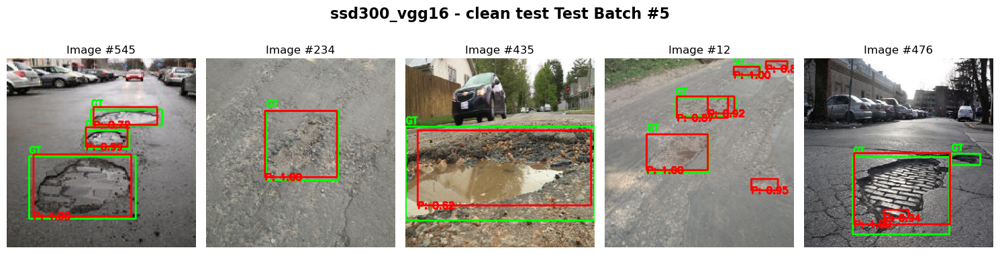

Mean Average Precision @ 0.5 : 0.4307 FPS: 239.97


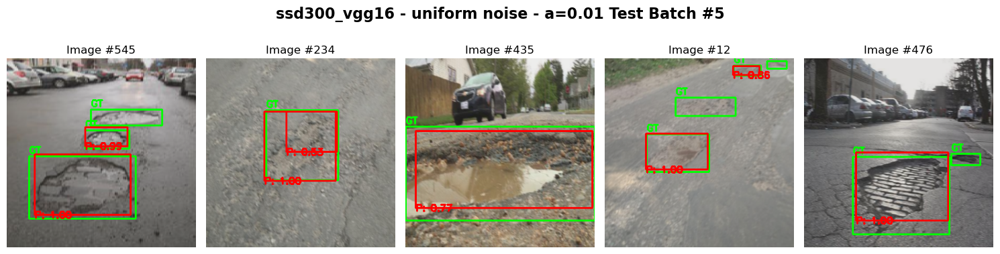

Mean Average Precision @ 0.5 : 0.0785 FPS: 245.71


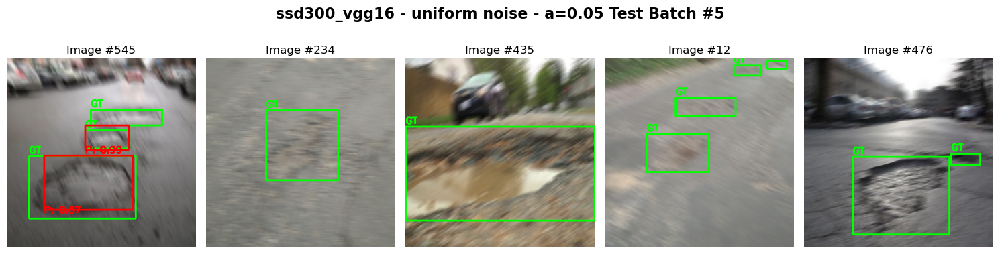

Mean Average Precision @ 0.5 : 0.0099 FPS: 251.48


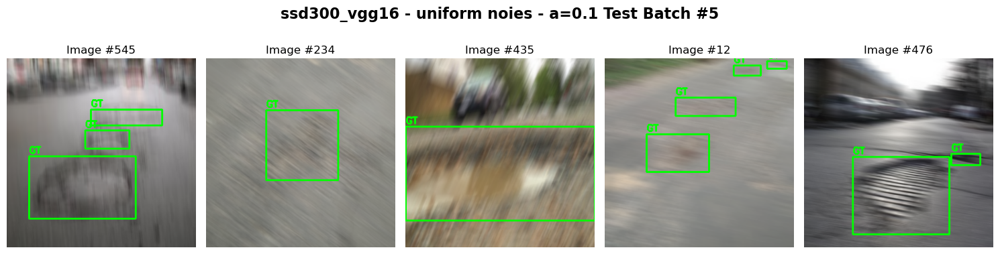

Mean Average Precision @ 0.5 : 0.3519 FPS: 237.05


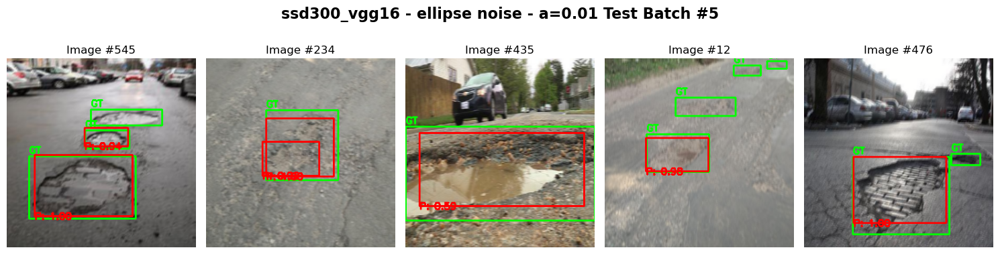

Mean Average Precision @ 0.5 : 0.0778 FPS: 248.42


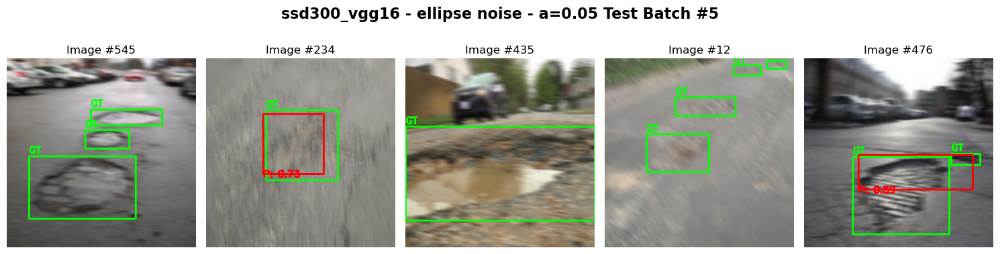

Mean Average Precision @ 0.5 : 0.0050 FPS: 267.59


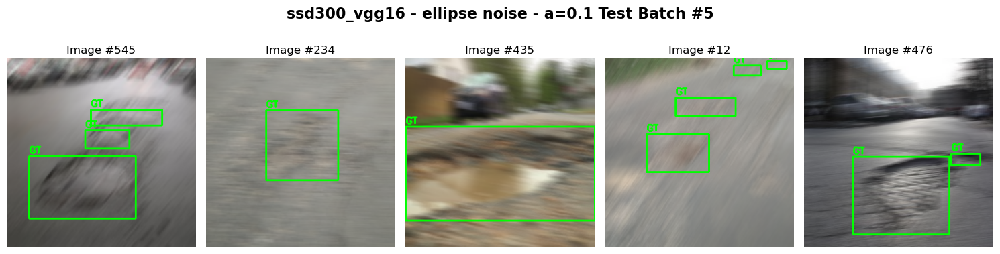

Mean Average Precision @ 0.5 : 0.1722 FPS: 244.54


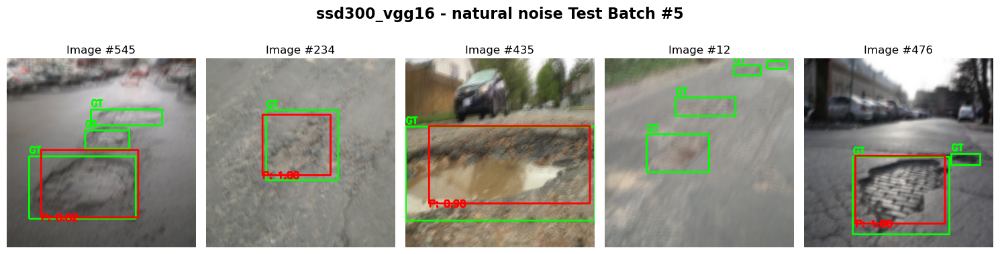

In [9]:
model_name = "ssd300_vgg16"
model = trainer.get_model(model_name=model_name) 
state_dict = torch.load("../data/models/ssd300_vgg16/ssd300_vgg16_best.pth", weights_only=True)
model.load_state_dict(state_dict)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)  # Move the model to the GPU
model.eval()  # Set the model to evaluation mode

# test the model
batch_index = 5
history['test_map50'] = evaluator.test_model(model, test_set, index=batch_index, title="ssd300_vgg16 - clean test")
history['uni001_map50'] = evaluator.test_model(model, test_set_uni_001, index=batch_index, title="ssd300_vgg16 - uniform noise - a=0.01")
history['uni005_map50'] = evaluator.test_model(model, test_set_uni_005, index=batch_index, title="ssd300_vgg16 - uniform noise - a=0.05")
history['uni01_map50'] = evaluator.test_model(model, test_set_uni_01, index=batch_index, title="ssd300_vgg16 - uniform noies - a=0.1")
history['eli001_map50'] = evaluator.test_model(model, test_set_elli_001, index=batch_index, title="ssd300_vgg16 - ellipse noise - a=0.01")
history['eli005_map50'] = evaluator.test_model(model, test_set_elli_005, index=batch_index, title="ssd300_vgg16 - ellipse noise - a=0.05")
history['eli01_map50'] = evaluator.test_model(model, test_set_elli_01, index=batch_index, title="ssd300_vgg16 - ellipse noise - a=0.1")
history['nat_map50'] = evaluator.test_model(model, test_set_nat, index=batch_index, title="ssd300_vgg16 - natural noise")

In [10]:
utils.update_json(history, model_name="ssd300_vgg16", save_path='../')

In [12]:
# Train with data augmentation:
history = trainer.train_from_config(model_config_path="../data/models/ssd300_vgg16/ssd300_vgg16_best_params.json", train_set=train_set, val_set=val_set, save_path="../data/models/ssd300_vgg16/", kornia_aug=True)

Starting training for ssd300_vgg16 with the following parameters:
{'batch_size': 8, 'epochs': 100, 'preweight_mode': 'fine_tuning', 'optimizer': 'AdamW', 'lr': 0.0009467475340372642, 'beta1': 0.8834165199724515, 'beta2': 0.9690194026386639, 'weight_decay': 0.0015812143275965708, 'scheduler': 'OneCycleLR', 'max_lr': 0.002747758441042921}
Epoch 1/100, Train Loss: 303.6088, Val mAP@50: 0.1144, FPS: 266.19, Epoch Time: 5.47 seconds
Epoch 2/100, Train Loss: 223.6900, Val mAP@50: 0.2658, FPS: 270.68, Epoch Time: 5.45 seconds
Epoch 3/100, Train Loss: 196.5224, Val mAP@50: 0.2979, FPS: 286.55, Epoch Time: 5.48 seconds
Epoch 4/100, Train Loss: 180.1618, Val mAP@50: 0.3776, FPS: 280.09, Epoch Time: 5.50 seconds
Epoch 5/100, Train Loss: 154.9161, Val mAP@50: 0.4306, FPS: 283.85, Epoch Time: 5.58 seconds
Epoch 6/100, Train Loss: 147.3892, Val mAP@50: 0.4040, FPS: 279.09, Epoch Time: 5.43 seconds
Epoch 7/100, Train Loss: 151.0440, Val mAP@50: 0.4892, FPS: 287.58, Epoch Time: 5.37 seconds
Epoch 8/10

Mean Average Precision @ 0.5 : 0.4681 FPS: 244.17


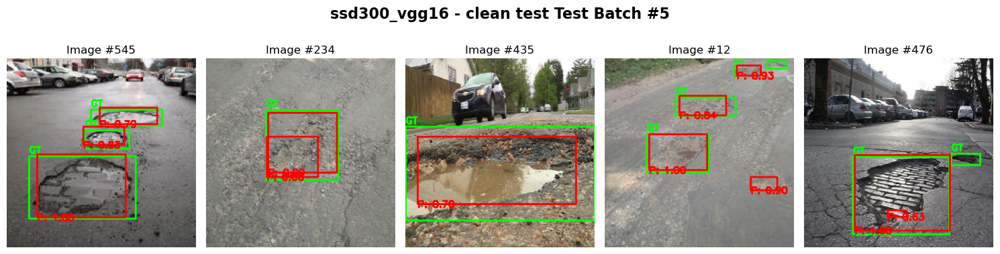

Mean Average Precision @ 0.5 : 0.4695 FPS: 237.44


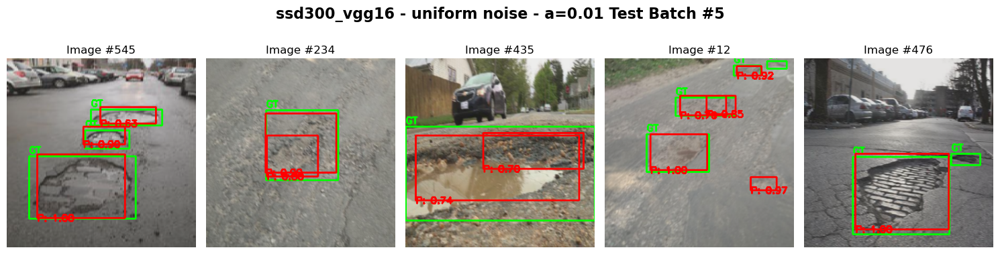

Mean Average Precision @ 0.5 : 0.3967 FPS: 239.42


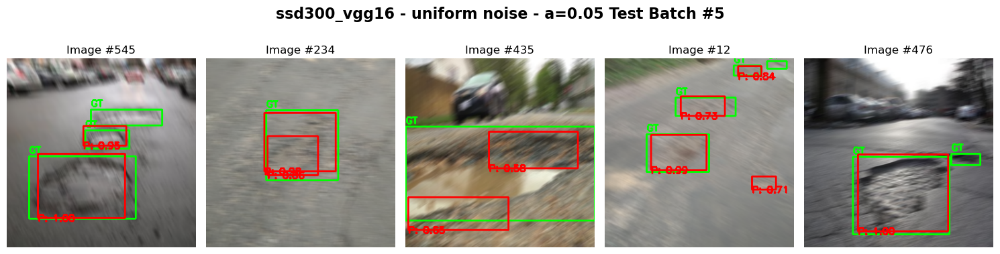

Mean Average Precision @ 0.5 : 0.3297 FPS: 237.96


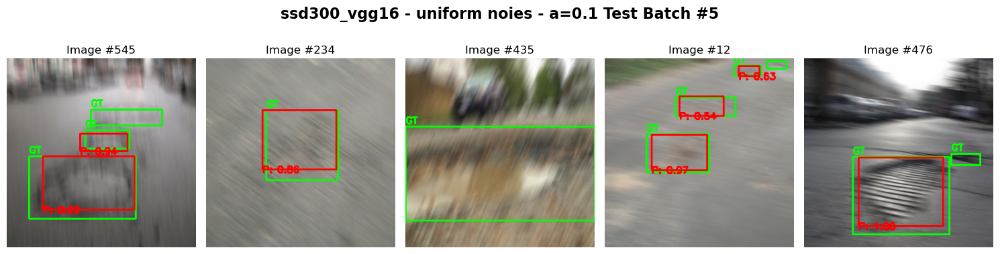

Mean Average Precision @ 0.5 : 0.4643 FPS: 240.41


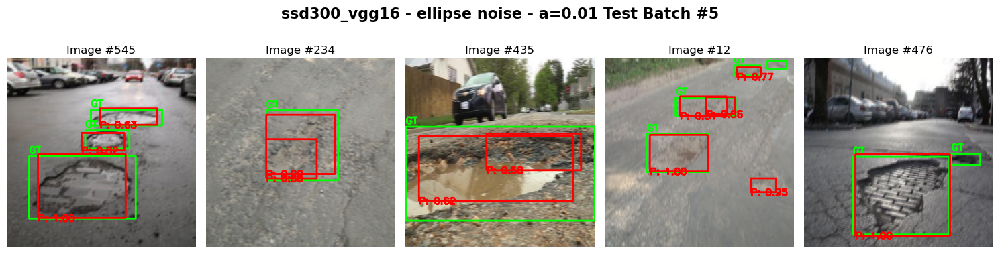

Mean Average Precision @ 0.5 : 0.3487 FPS: 251.48


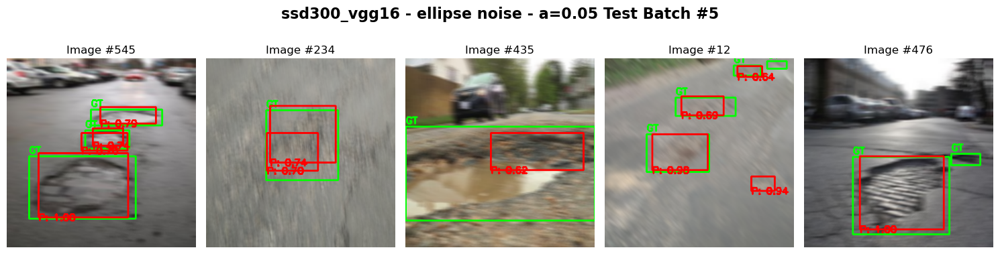

Mean Average Precision @ 0.5 : 0.2666 FPS: 249.82


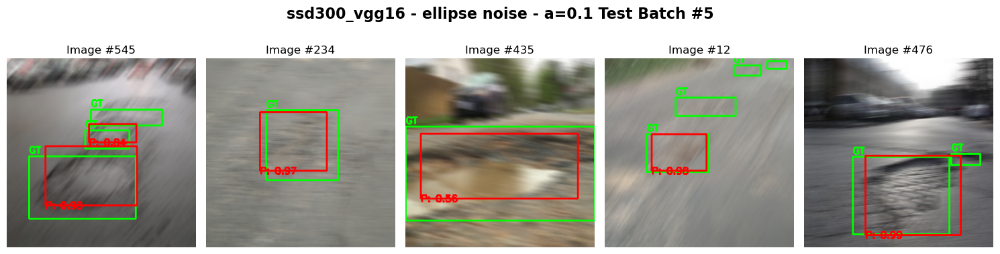

Mean Average Precision @ 0.5 : 0.3806 FPS: 253.52


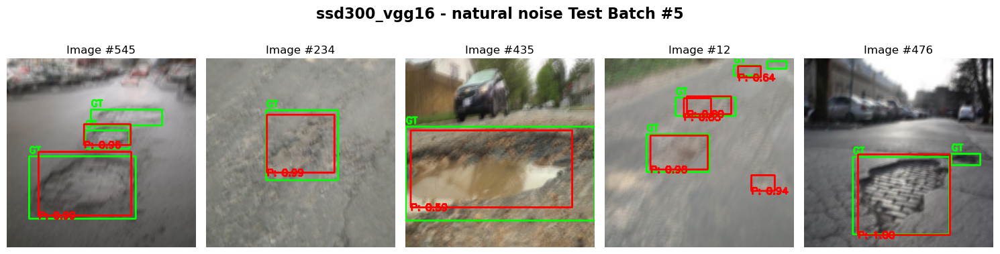

In [15]:
model_name = "ssd300_vgg16"
model = trainer.get_model(model_name=model_name) 
state_dict = torch.load("../data/models/ssd300_vgg16/ssd300_vgg16_aug_best.pth", weights_only=True)
model.load_state_dict(state_dict)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)  # Move the model to the GPU
model.eval()  # Set the model to evaluation mode

# test the model
batch_index = 5
history['test_map50'] = evaluator.test_model(model, test_set, index=batch_index, title="ssd300_vgg16 - clean test")
history['uni001_map50'] = evaluator.test_model(model, test_set_uni_001, index=batch_index, title="ssd300_vgg16 - uniform noise - a=0.01")
history['uni005_map50'] = evaluator.test_model(model, test_set_uni_005, index=batch_index, title="ssd300_vgg16 - uniform noise - a=0.05")
history['uni01_map50'] = evaluator.test_model(model, test_set_uni_01, index=batch_index, title="ssd300_vgg16 - uniform noies - a=0.1")
history['eli001_map50'] = evaluator.test_model(model, test_set_elli_001, index=batch_index, title="ssd300_vgg16 - ellipse noise - a=0.01")
history['eli005_map50'] = evaluator.test_model(model, test_set_elli_005, index=batch_index, title="ssd300_vgg16 - ellipse noise - a=0.05")
history['eli01_map50'] = evaluator.test_model(model, test_set_elli_01, index=batch_index, title="ssd300_vgg16 - ellipse noise - a=0.1")
history['nat_map50'] = evaluator.test_model(model, test_set_nat, index=batch_index, title="ssd300_vgg16 - natural noise")

In [16]:
utils.update_json(history, model_name="ssd300_vgg16_aug", save_path='../')